In [1]:
import numpy as np
import fitsio
from astropy.table import Table, join
import os, sys
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition,
                                                  mark_inset)
import pandas as pd
import corner
import mpl_scatter_density

# Make the norm object to define the image stretch
from astropy.visualization import LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
norm = ImageNormalize(vmin=0., vmax=1000, stretch=LogStretch())

import sys
sys.path.insert(0, '/global/homes/s/severett/repos/balutils/')
from balutils import stacked_catalogs as sc

import seaborn as sb
plt.style.use('seaborn')
sb.set_context("notebook", font_scale=1.5)

/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  


## Make new catalog

In [6]:
run = 'run2-gridtest'
ver = 1.4

match_file = '/project/projectdirs/des/severett/Balrog/{}/stacked_catalogs/{}/sof/balrog_matched_catalog_sof_{}_v{}.fits'.format(run, ver, run, ver)
det_file = '/project/projectdirs/des/severett/Balrog/{}/stacked_catalogs/{}/sof/balrog_detection_catalog_sof_{}_v{}.fits'.format(run, ver, run, ver)

match_cols = ['bal_id', 'true_id', 'meas_cm_mag_deredden',  'true_bdf_mag_deredden', 'meas_flags', 'meas_tilename', 'meas_id',
              'meas_cm_fracdev', 'true_bdf_fracdev', 'meas_cm_T', 'true_bdf_T', 'meas_cm_mag', 'true_bdf_mag', 'meas_cm_flux_s2n', 'meas_cm_s2n_r',
              'true_bdf_flux_deredden', 'meas_cm_flux_cov']
det_cols = ['bal_id']
# sof = sc.BalrogMatchedCatalog(match_file, det_file, match_cols=match_cols, match_type='sof_only', vb=True)

print('Loading matched file...')
match = Table(fitsio.read(match_file, columns=match_cols))
print('Loading det file...')
det = Table(fitsio.read(det_file, columns=det_cols))
print('joining...')
sof = join(match, det, keys='bal_id', join_type='inner')
assert len(match) == len(sof)

# Match to Ian's DF classifier
df_file = 'cats/ugriz-mof02-JHK-extcorr_27May20_kNN_class.fits'
df = Table.read(df_file)
df.rename_column('id', 'true_id')

print('Joining with df classifier...')
sof = join(sof, df, keys='true_id', join_type='left')

cuts = np.where(
    sof['meas_flags'] == 0
#     (sof['meas_FLAGS_GOLD_SOF_ONLY'] < 2) &
#     (sof['flags_foreground'] == 0 ) &
#     (sof['flags_footprint'] == 1) &
#     (sof['flags_badregions'] < 2) &
#     (sof['meas_EXTENDED_CLASS_SOF'] > 1) #&
# #     (sof['match_flag_1.5_asec'] < 2)
)

print('Making cuts...')
sof = sof[cuts]

Loading matched file...
Loading det file...
joining...
Joining with df classifier...
Making cuts...


In [7]:
sof_file = './cats/balrog_sof_gold_phot_scatter_gridtest.fits' 
print('Writing catalog...')
sof.write(sof_file, overwrite=True)

Writing catalog...


## Load existing catalog

In [2]:
sof_file = './cats/balrog_sof_gold_phot_scatter_gridtest.fits' 
sof = Table.read(sof_file)

## SOF CM Mag Scatter

Ideas:
- high transparency scatter
- contours
- inset for inside region

In [3]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sb.axisgrid.FacetGrid) or \
            isinstance(self.sg, sb.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sb.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])
        
        # added by me
#         self.sg.ax_marg_x.remove()

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())
        
# set the colormap and centre the colorbar
class MidpointNormalize(colors.Normalize):
	"""
	Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

	e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
	"""
	def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
		self.midpoint = midpoint
		colors.Normalize.__init__(self, vmin, vmax, clip)

	def __call__(self, value, clip=None):
		# I'm ignoring masked values and all kinds of edge cases to make a
		# simple example...
		x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
		return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))
    
def calc_bin_stats(true, diff, bins):
    '''
    Calculate mean offset mean, median, nd scatter in truth bins, given bin edges
    '''
    
    mean = -1*np.ones(len(bins)-1)
    med = -1*np.ones(len(bins)-1)
    scatter = -1*np.ones(len(bins)-1)
    
    bin_mean = np.mean([bins[:-1], bins[1:]], axis=0)
    
    k = 0
    for b1, b2 in zip(bins, bins[1:]):
        sample = np.where((true > b1) & (true <= b2))
        mean[k] = np.mean(diff[sample])
        med[k] = np.median(diff[sample])
        scatter[k] = np.std(diff[sample])
        k += 1
        
    return mean, med, scatter, bin_mean    

def calc_meas_mag_err(true_mag, true_flux, flux_var, bins):
    mag_err = -1*np.ones(len(bins)-1)
    
    bin_mean = np.mean([bins[:-1], bins[1:]], axis=0)
    
    k = 0
    for b1, b2 in zip(bins, bins[1:]):
        sample = np.where((true_mag > b1) & (true_mag <= b2))
        
        sig_f = np.sqrt(flux_var[sample])
        sig_m = (2.5 / np.log(10)) * (sig_f / true_flux[sample])
        var_m = np.power(sig_m, 2)
        
        mag_err[k] = np.sqrt(np.mean(var_m))
        k += 1
        
    return mag_err, bin_mean

Text(0.5, 0.98, 'Balrog y3-merged SOF GOLD sample')

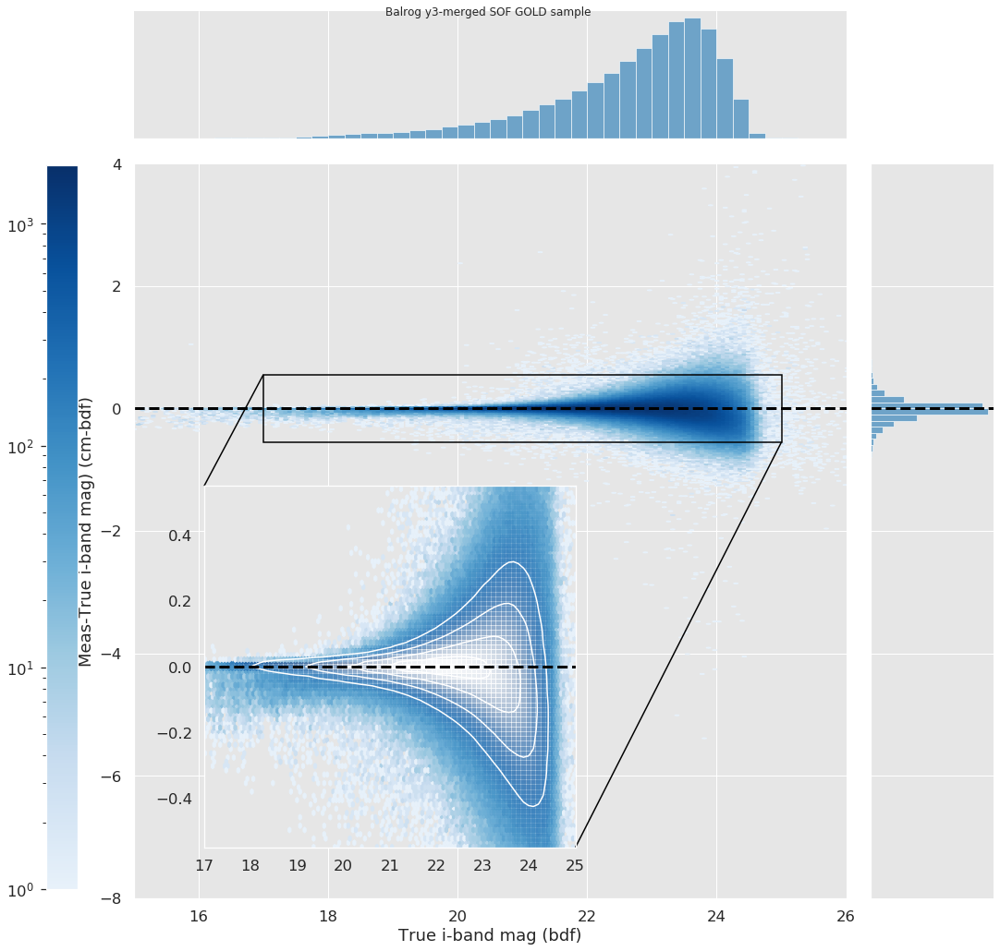

In [4]:
sb.set_style("darkgrid", {"axes.facecolor": "0.9"})
# sb.set_style({'axes.facecolor': 'green'})

bindx = dict(zip('griz', range(4)))

xlim = [15, 26]
ylim = [-8, 4]

N = 1
n_levels=4

vmin = 0.0005
truncated_cmap = truncate_colormap(plt.get_cmap('Blues'), 0.08, 1.0)

b = 'i'
bi = bindx[b]
x = sof['true_bdf_mag_deredden'][:, bi]
y = sof['meas_cm_mag_deredden'][:, bi] - x

cuts = np.where(
    (x > xlim[0]-1) &
    (x < xlim[1]+1) &
    (y > ylim[0]-1) &
    (y < ylim[1]+1)  )

fig = plt.Figure()

ax1 = fig.add_subplot(1, 1, 1)
# g = sb.JointGrid(x[cuts], y[cuts])
g = sb.JointGrid(x[cuts][::N], y[cuts][::N])

hb_grid = (200, 400)
g = g.plot_joint(plt.hexbin, gridsize=hb_grid, norm=colors.LogNorm(), cmap=truncated_cmap, mincnt=1)
plt.axhline(0, c='k', ls='--', lw=3)
plt.xlabel(f'True {b}-band mag (bdf)')
plt.ylabel(f'Meas-True {b}-band mag) (cm-bdf)')
plt.xlim(xlim)
plt.ylim(ylim)

# r = ((xlim[0], xlim[1]), (ylim[0], ylim[1]))
# im = corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=100, scale_hist=1,
#                    plot_datapoints=False, plot_density=False, no_fill_contours=True,
#                    color='white')

# Create a set of inset Axes: these should fill the bounding box allocated to
# them.
ax2 = plt.axes([0, 0, 1, 1])
# Manually set the position and relative size of the inset axes within ax1
ip = InsetPosition(ax1, [0.14, 0.085, 0.45, 0.45])
ax2.set_axes_locator(ip)
# Mark the region corresponding to the inset axes on ax1 and draw lines
# in grey linking the two axes.
mark_inset(g.ax_joint.axes, ax2, loc1=2, loc2=4, fc="none", ec='k', lw=1.5)

inset_xlim = [17, 25]
inset_ylim = [-.55, .55]
# inset_cuts = np.where(
#     (x > inset_xlim[0]-1) &
#     (x < inset_xlim[1]+1) &
#     (y > inset_ylim[0]-1) &
#     (y < inset_ylim[1]+1)  )
r = (inset_xlim, inset_ylim)

plt.hexbin(x[cuts][::N], y[cuts][::N], gridsize=hb_grid, norm=colors.LogNorm(), cmap=truncated_cmap, mincnt=1)
im = corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=True, no_fill_contours=True,
                   color='white', smooth=True)
plt.axhline(0, c='k', ls='--', lw=3)

# Marginals
# g = g.plot_marginals(sb.distplot)
dx = .25
xbins = np.arange(xlim[0], xlim[1], dx)
g.ax_marg_x.hist(x[cuts][::N], color='tab:blue', alpha=.6, bins=xbins)

dy = 0.1
ybins = np.arange(ylim[0], ylim[1]+dy, dy)
g.ax_marg_y.hist(y[cuts][::N], color='tab:blue', alpha=.6, bins=ybins, orientation='horizontal')
g.ax_marg_y.axhline(0, lw=3, c='k', ls='--')

# Colorbar
cbaxes = plt.gcf().add_axes([0.085, 0.15, 0.03, 0.68]) 
cb = plt.colorbar(g.ax_joint._current_image, cax=cbaxes)
cbaxes.yaxis.set_ticks_position('left')

plt.gcf().set_size_inches(16, 16)
plt.gcf().suptitle('Balrog y3-merged SOF GOLD sample')

In [31]:
bad = sof[(x>17.5) & (x<17.75) & (y>-0.2) & (y<-0.185) & (sof['meas_tilename']=='DES0121-3249')]
bad

true_id,true_bdf_T,true_bdf_mag [4],true_bdf_fracdev,true_bdf_mag_deredden [4],bal_id,meas_id,meas_flags,meas_cm_T,meas_cm_flux_s2n [4],meas_cm_mag [4],meas_cm_s2n_r,meas_cm_fracdev,meas_tilename,meas_cm_mag_deredden [4],NearestNeighbors_class
int64,float64,float64,float64,float32,int64,int64,int32,float64,float64,float64,float64,float32,str12,float64,float64
697419346,53.807039456991866,18.489608057586793 .. 17.692182760278428,0.18567642023915176,18.400728 .. 17.658775,1001210324910299,6752,0,584.065177860614,470.75679348671605 .. 277.8191312609027,18.29330426358297 .. 17.500948897629094,565.7391956648967,0.438125,DES0121-3249,18.206704265406874 .. 17.468448898821187,1.0


In [32]:
bad['meas_id']

6752


g 0


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


r 1


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


i 2


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


z 3


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


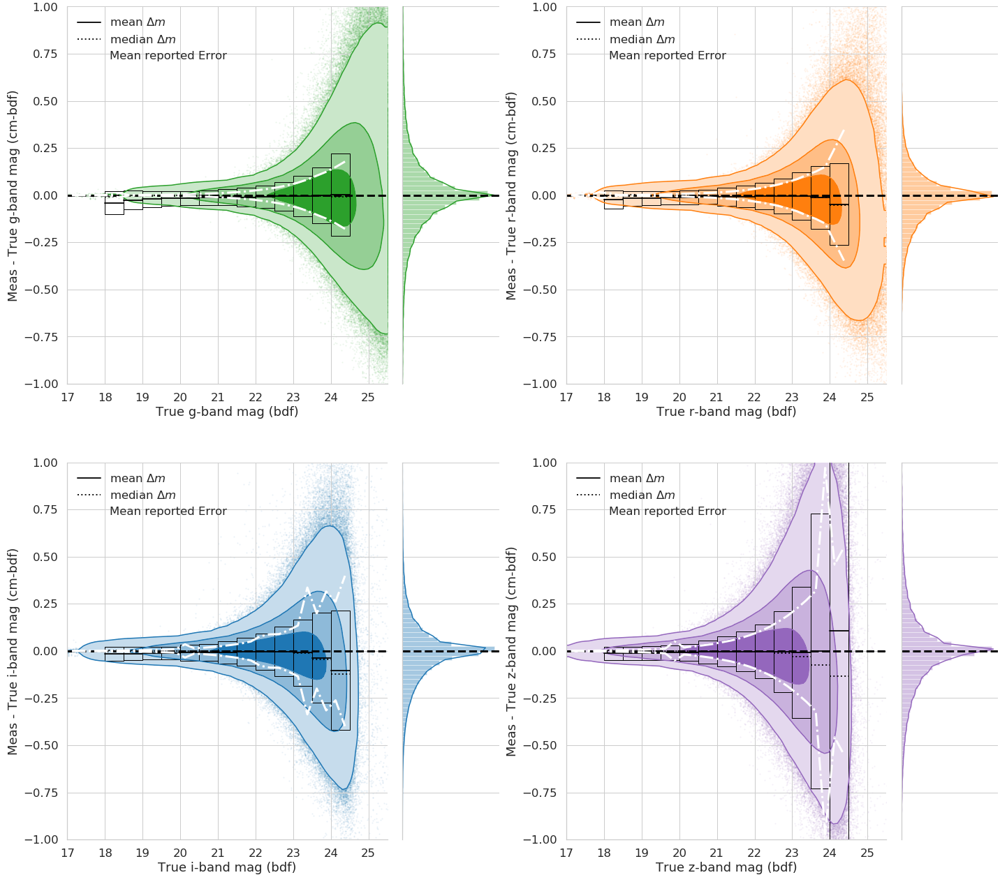

In [4]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = [17, 25.5]
ylim = [-1, 1]
r = (xlim, ylim)
bins = 75

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 20
N = 1
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']
# c = ['limegreen', 'salmon', 'skyblue', 'orchid']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

mag_suffix = '_deredden' # For corrected mags
# mag_suffix = '' # For uncorrected mags

cut_on_dt = True
dt_cut = .5

stats_t = Table()

k = 0
for b, bi in bindx.items():
    k += 1
    if vb is True:
        print(b, bi)
        
    x = sof[f'true_bdf_mag{mag_suffix}'][:, bi]
    y = sof[f'meas_cm_mag{mag_suffix}'][:, bi] - x
    
    if cut_on_dt is True:
        dt = abs(sof[f'meas_cm_T'] - sof[f'true_bdf_T'])

    
    cuts = ((x > xlim[0]-1) &
            (x < xlim[1]+1) &
            (y > ylim[0]-1) &
            (y < ylim[1]+1) )
        
    if cut_on_dt is True:
        cuts = np.where(cuts & (dt < dt_cut))
    else:
        cuts = np.where(cuts)

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=False,
                   fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels)
    plt.plot(x[cuts][::N], y[cuts][::N], "o", ms=2, zorder=-1, rasterized=True, alpha=0.1, c=c[bi], mec='None')
#     plt.hist2d(x[cuts][::10*N], y[cuts][::10*N], range=r, bins=75, scale_hist=1,
#                    plot_datapoints=True, plot_density=False, no_fill_contours=True,
#                    plot_contours=False, color=c[bi])
    plt.axhline(0, ls='--', c='k', lw=3)
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    # Get rolling bias & scatter
    dx = 0.5
    xbins = np.arange(xlim[0]+1, xlim[1]+dx-1, dx)
    mean, med, scatter, bin_mean = calc_bin_stats(x, y, xbins)
    
    k = 0
    for b1, b2 in zip(xbins, xbins[1:]):
        if k == 0:
            l1 = r'mean $\Delta m$'
            l2 = r'median $\Delta m$'
        else:
            l1 = None
            l2 = None
        plt.plot([b1, b2], [mean[k], mean[k]], c='k', label=l1, lw=2, alpha=0.9)
        plt.plot([b1, b2], [med[k], med[k]], c='k', ls=':', label=l2, lw=2, alpha=0.9)
#         plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='lightgrey', edgecolor='dimgrey', alpha=0.2)
        plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='None', edgecolor='k')
        k += 1
#     plt.step(xbins[:-1], mean, c='r', label=r'mean $\Delta m$')
#     plt.step(xbins[:-1], med, c='g', label=r'median $\Delta$ m$')

    # Compare to meas estimates
    dx = 0.25
    xbins2 = np.arange(xlim[0], xlim[1]+dx-1, dx)
    true_mag = x[cuts][::N]
    true_flux = sof[f'true_bdf_flux{mag_suffix}'][:, bi][cuts][::N]
    flux_var = sof['meas_cm_flux_cov'][:, bi, bi][cuts][::N]
    
    mag_err, bin_mean2 = calc_meas_mag_err(true_mag, true_flux, flux_var, xbins2)
    
    plt.plot(bin_mean2, mag_err, lw=3, c='white', ls='dashdot', label='Mean reported Error')
    plt.plot(bin_mean2, -mag_err, lw=3, c='white', ls='dashdot')
    
    plt.legend(loc='upper left')
    
    # Save to table
    stats_t[f'mean_{b}'] = mean
    stats_t[f'med_{b}'] = med
    stats_t[f'std_{b}'] = scatter
    stats_t[f'bin_mean_{b}'] = bin_mean

    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.xlabel(f'True {b}-band mag (bdf)')
    plt.ylabel(f'Meas - True {b}-band mag (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(s, s))
gs = gridspec.GridSpec(2, 2)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

# mg0.sg.ax_marg_x.remove()

plt.tight_layout()
# fig.suptitle('Balrog y3-merged GOLD Sample')
fig.set_size_inches(s, s)

# Save table
if 'deredden' in mag_suffix:
    l = 'deredden'
else:
    l = 'uncorrected'
if cut_on_dt is True:
    lt = '_dt'
else:
    lt = ''
stats_t.write(f'./tables/grid-gal-scatter-mag-stats-{l}{lt}.fits', overwrite=True)

g 0


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


r 1


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


i 2


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


z 3


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


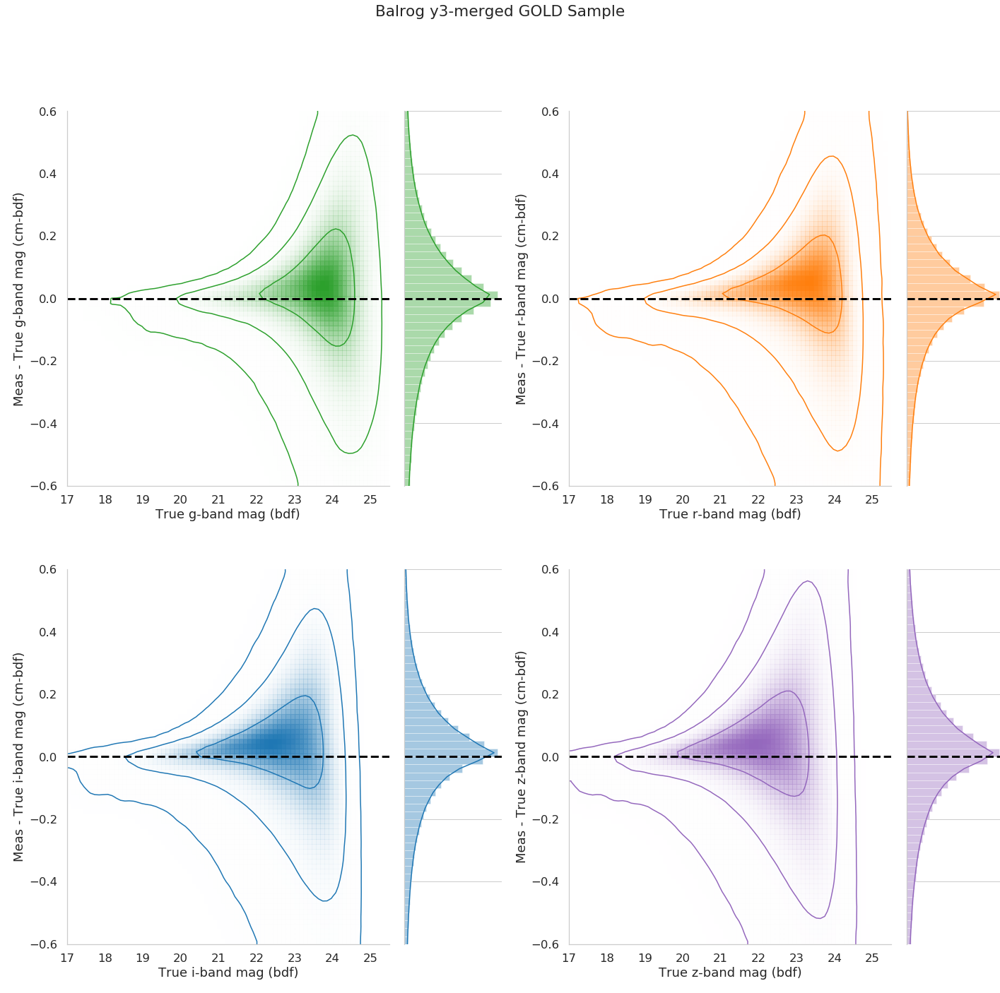

In [61]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = [17, 25.5]
ylim = [-0.6, 0.6]
r = (xlim, ylim)
bins = 75

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 20
N = 1
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']
# c = ['limegreen', 'salmon', 'skyblue', 'orchid']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3+dl, dl) ** 2)

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

stats_t = Table()

k = 0
for b, bi in bindx.items():
    k += 1
    if vb is True:
        print(b, bi)
        
    x = sof['true_bdf_mag_deredden'][:, bi]
    y = sof['meas_cm_mag_deredden'][:, bi] - x

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=True, no_fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=1, levels=levels)
    plt.s
#     plt.hist2d(x[cuts][::10*N], y[cuts][::10*N], range=r, bins=75, scale_hist=1,
#                    plot_datapoints=True, plot_density=False, no_fill_contours=True,
#                    plot_contours=False, color=c[bi])
    plt.axhline(0, ls='--', c='k', lw=3)
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    # Get rolling bias & scatter
    dx = 0.5
    xbins = np.arange(xlim[0]+1, xlim[1]+dx-1, dx)
    mean, med, scatter = calc_bin_stats(x, y, xbins)
    
    k = 0
    for b1, b2 in zip(xbins, xbins[1:]):
        if k == 0:
            l1 = r'mean $\Delta m$'
            l2 = r'median $\Delta m$'
        else:
            l1 = None
            l2 = None
        plt.plot([b1, b2], [mean[k], mean[k]], c='dimgrey', label=l1, lw=2, alpha=1)
        plt.plot([b1, b2], [med[k], med[k]], c='dimgrey', ls=':', label=l2, lw=2, alpha=1)
#         plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='lightgrey', edgecolor='dimgrey', alpha=0.2)
        plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='None', edgecolor='dimgrey')
        k += 1
#     plt.step(xbins[:-1], mean, c='r', label=r'mean $\Delta m$')
#     plt.step(xbins[:-1], med, c='g', label=r'median $\Delta$ m$')
    plt.legend(loc='upper left')
    
    # Save to table
    stats_t[f'mean_{b}'] = mean
    stats_t[f'med_{b}'] = med
    stats_t[f'std_{b}'] = scatter

    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.xlabel(f'True {b}-band mag (bdf)')
    plt.ylabel(f'Meas - True {b}-band mag (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(s, s))
gs = gridspec.GridSpec(2, 2)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

# mg0.sg.ax_marg_x.remove()

plt.tight_layout()
fig.suptitle('Balrog y3-merged GOLD Sample')
fig.set_size_inches(s, s)

# Save table
stats_t.write('./tables/gal-scatter-mag-stats.fits', overwrite=True)

In [17]:
print(xbins)
print(bias)

[17. 18. 19. 20. 21. 22. 23. 24. 25. 26.]
[0.05899455 0.         0.         0.         0.         0.
 0.         0.         0.        ]


g 0


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


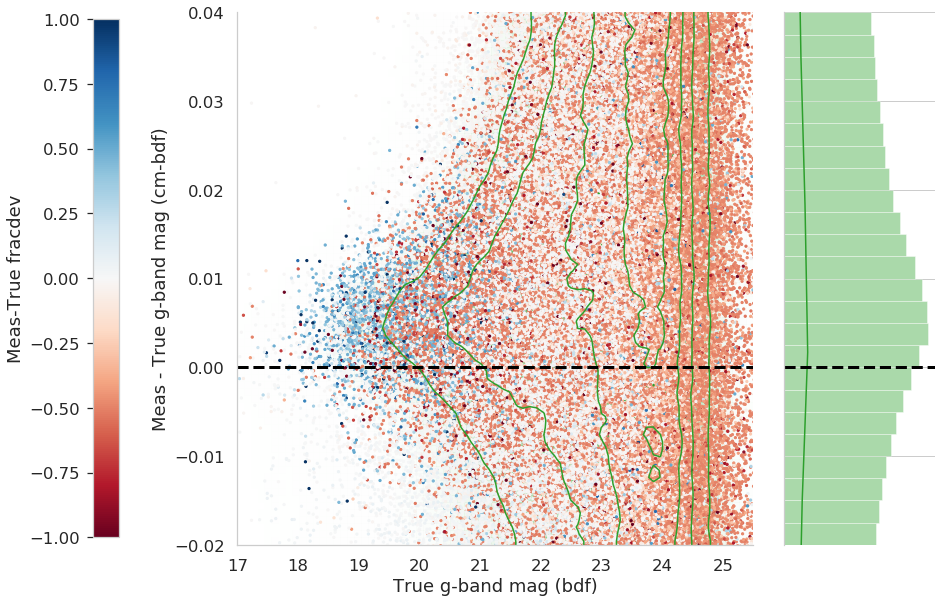

r 1


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


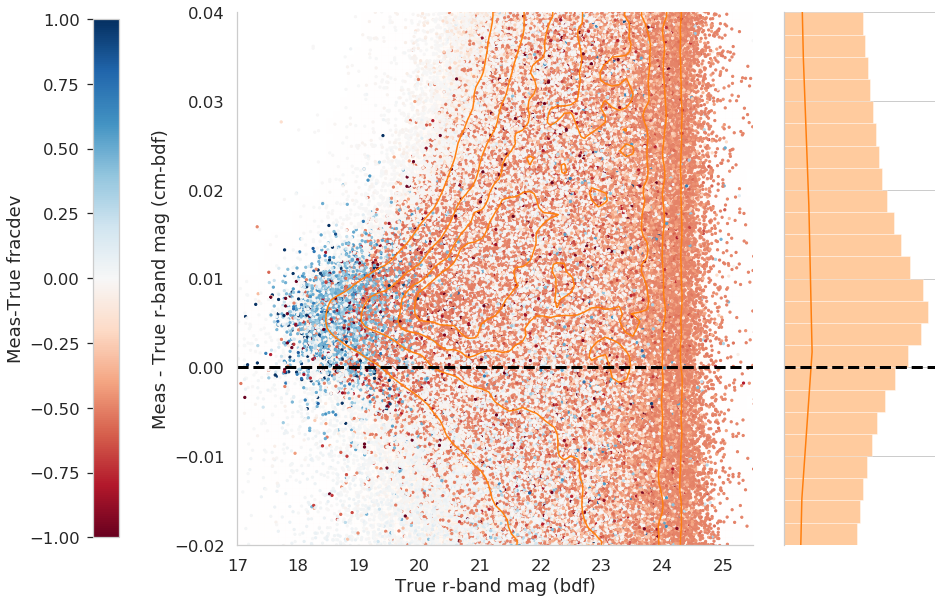

i 2


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


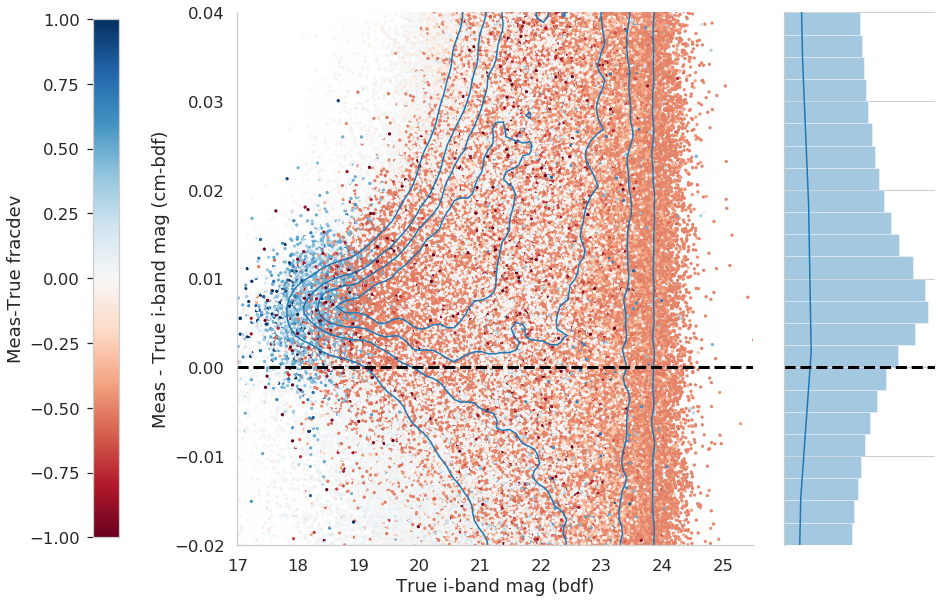

z 3


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


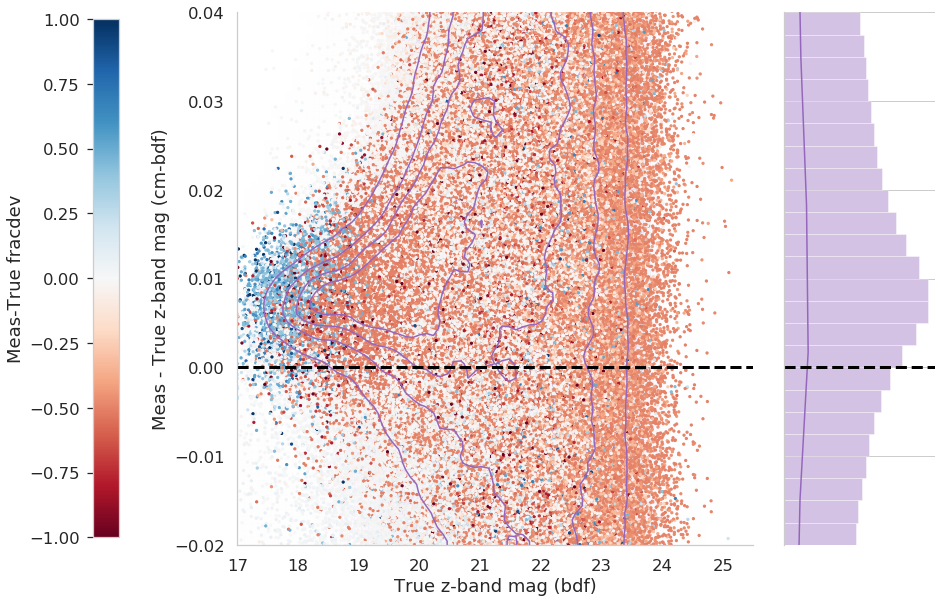

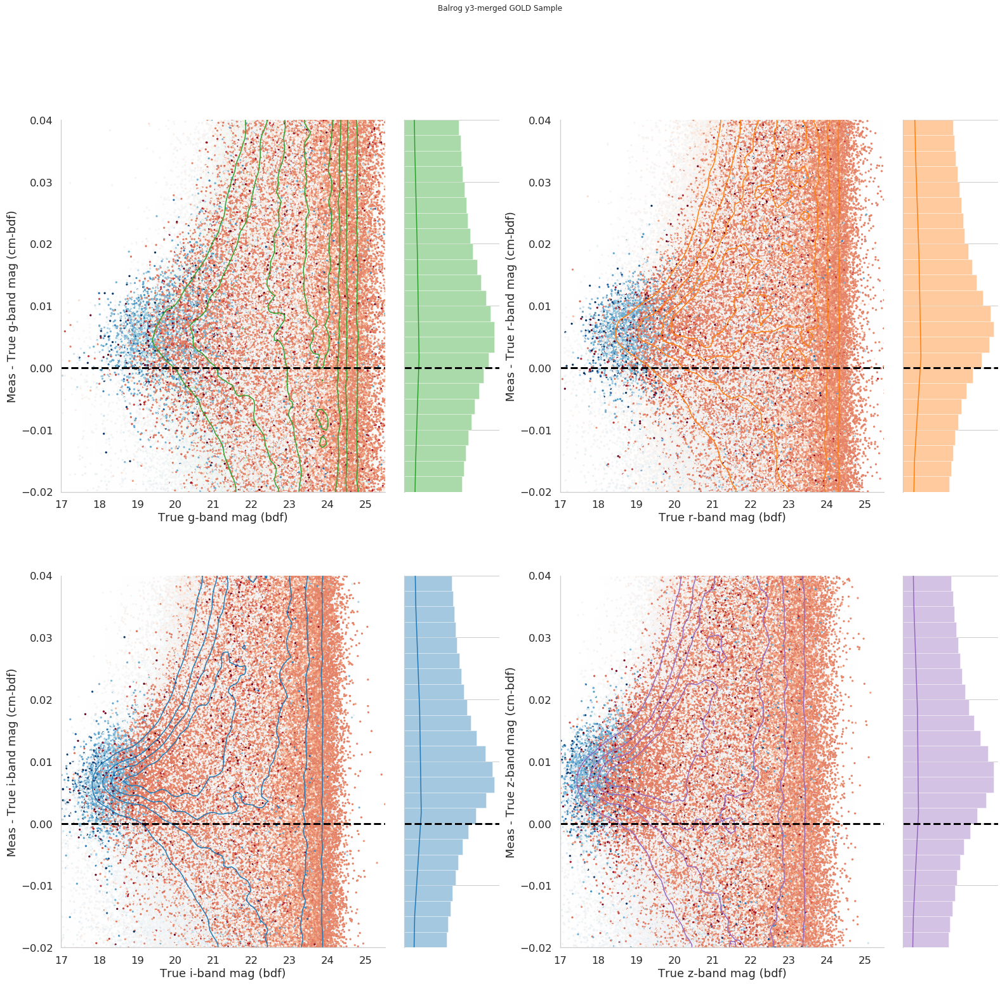

In [25]:
sb.set_style("whitegrid")#, {"axes.facecolor": "0.9"})

bands = 'griz'
bindx = dict(zip('griz', range(len(bands))))

xlim = [17, 25.5]
ylim = [-0.020, 0.040]
r = (xlim, ylim)
bins = 75

dy = 0.0025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 22
N = 2
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']

vb = True
show_fd_scatter = True

# fig, axes = plt.subplots(2, 2)

g = {}

k = 0
for b, bi in bindx.items():
    k += 1
    if vb is True:
        print(b, bi)
        
    x = sof['true_bdf_mag_deredden'][:, bi]
    y = sof['meas_cm_mag_deredden'][:, bi] - x

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=True, no_fill_contours=True,
                   color=c[bi], smooth=True, lw=3)
    
    # If you want extra fracdev scatter plot
    if show_fd_scatter is True:
        alpha = 1
        size = 5
        M = 10
        fd_err = (sof['meas_cm_fracdev'][cuts][::M*N] - sof['true_bdf_fracdev'][cuts][::M*N])
        scatter = plt.scatter(x[cuts][::M*N], y[cuts][::M*N], alpha=alpha, c=fd_err, cmap='RdBu', s=size,
                    norm=MidpointNormalize(midpoint=0, vmin=np.min(fd_err), vmax=np.max(fd_err)))
    
#     plt.colorbar(g[b].ax_joint.collections[0])
    plt.axhline(0, ls='--', c='k', lw=3)
#     mean = np.mean(y[cuts][::N])
#     plt.axhline(mean, ls='--', c='r', lw=3, label=f'med={mean}')
#     plt.legend()
    # Colorbar
#     cbaxes = plt.gcf().add_axes([0.01, 0.15, 0.03, 0.68])
#     counts, xedges, yedges, im = plt.hist2d(x[cuts][::N], y[cuts][::N], norm=colors.LogNorm(), bins=75)
#     cb = plt.colorbar(im)
#     cbaxes.yaxis.set_ticks_position('left')
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.xlabel(f'True {b}-band mag (bdf)')
    plt.ylabel(f'Meas - True {b}-band mag (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)
    
    # Colorbar
    if show_fd_scatter is True:
        cbaxes = plt.gcf().add_axes([0.0, 0.15, 0.03, 0.6]) 
        cb = plt.colorbar(g[b].ax_joint._current_image, cax=cbaxes)
        cbaxes.yaxis.set_ticks_position('left')
        cb.set_label('Meas-True fracdev', rotation=90)
        cbaxes.yaxis.set_label_position('left')
    
    plt.gcf().set_size_inches(12, 12)
    plt.show()

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(s, s))
gs = gridspec.GridSpec(2, 2)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

gs.tight_layout(fig)

# mg0.sg.ax_marg_x.remove()

        
fig.suptitle('Balrog y3-merged GOLD Sample')
fig.set_size_inches(s, s)

## Colors

g 0
r 1
i 2


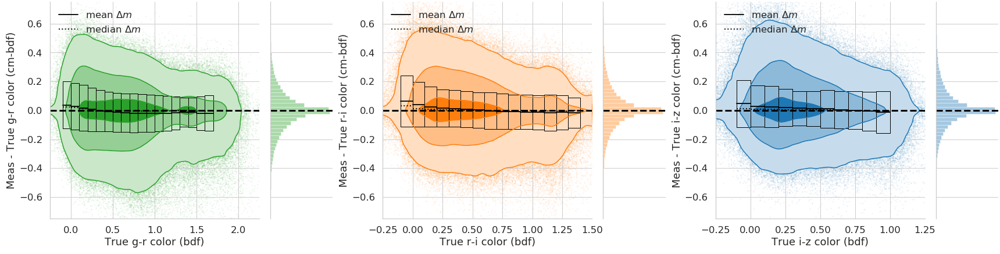

In [5]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = ([-0.25, 2.25], [-0.25, 1.5], [-0.25, 1.25])
ylim = [-0.75, 0.75]
bins = 75

cbin_range = ([-0.1, 1.7], [-0.1, 1.4], [-0.1, 1.])
cbin_dx = (0.1, 0.1, 0.05)

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 20
N = 1
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']
# c = ['limegreen', 'salmon', 'skyblue', 'orchid']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

mag_suffix = '_deredden' # For corrected mags
# mag_suffix = '' # For uncorrected mags

stats_t = Table()

k = 0
for b, bi in bindx.items():
    k += 1
    if k >= 4:
        break
    if vb is True:
        print(b, bi)
        
    x = sof['true_bdf_mag_deredden'][:, bi] - sof['true_bdf_mag_deredden'][:, bi+1] 
    y = (sof['meas_cm_mag_deredden'][:, bi] - sof['meas_cm_mag_deredden'][:, bi+1]) - x

#     cuts = np.where(
#         (x > xlim[k-1][0]-1) &
#         (x < xlim[k-1][1]+1) &
#         (y > ylim[0]-1) &
#         (y < ylim[1]+1)  )
    
    cuts = np.where(
        (sof['meas_cm_flux_s2n'][:,bi] > 5) &
        (sof['meas_cm_flux_s2n'][:,bi+1] > 5)
    )

# ax1 = fig.add_subplot(1, 1, 1)
    r = (xlim[k-1], ylim)

    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=False,
                   fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels)
    plt.plot(x[cuts][::N], y[cuts][::N], "o", ms=2, zorder=-1, rasterized=True, alpha=0.1, c=c[bi], mec='None')
#     plt.hist2d(x[cuts][::10*N], y[cuts][::10*N], range=r, bins=75, scale_hist=1,
#                    plot_datapoints=True, plot_density=False, no_fill_contours=True,
#                    plot_contours=False, color=c[bi])
    plt.axhline(0, ls='--', c='k', lw=3)
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    # Get rolling bias & scatter
    
    # due to non-detections, colors splan unrealistic range
    thresh = 4
    c_cuts = np.where(
        (x > -thresh) &
        (x < thresh) &
        (y > -thresh) &
        (y < thresh) &
        (sof['meas_cm_flux_s2n'][:,bi] > 5) &
        (sof['meas_cm_flux_s2n'][:,bi+1] > 5)
    )
    
    dx = 0.1
    xbins = np.arange(-1, 2.5+dx, dx)
    mean, med, scatter, bin_mean = calc_bin_stats(x[c_cuts], y[c_cuts], xbins)
    
    j = 0
    leg = False
    for b1, b2 in zip(xbins, xbins[1:]):
        if (b2 < cbin_range[k-1][0]) or (b2 > cbin_range[k-1][1]):
            j += 1
            continue
        if leg is False:
            l1 = r'mean $\Delta m$'
            l2 = r'median $\Delta m$'
            leg = True
        else:
            l1 = None
            l2 = None
        
        plt.plot([b1, b2], [mean[j], mean[j]], c='k', label=l1, lw=2, alpha=0.9)
        plt.plot([b1, b2], [med[j], med[j]], c='k', ls=':', label=l2, lw=2, alpha=0.9)
        plt.fill_between([b1, b2], mean[j]+scatter[j], mean[j]-scatter[j], facecolor='None', edgecolor='k')

        j += 1
        
    plt.legend(loc='upper left')
    
    # Save to table
#     stats_t[f'mean_{b}'] = mean
#     stats_t[f'med_{b}'] = med
#     stats_t[f'std_{b}'] = scatter
#     stats_t[f'bin_mean_{b}'] = bin_mean

    b1, b2 = b, 'griz'[bi+1]
    plt.xlim(xlim[k-1])
    plt.ylim(ylim)
    plt.xlabel(f'True {b1}-{b2} color (bdf)')
    plt.ylabel(f'Meas - True {b1}-{b2} color (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins, kde=False)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(24, 8))

gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])

# mg0.sg.ax_marg_x.remove()

plt.tight_layout()
# fig.suptitle('Balrog y3-merged GOLD Sample')
# fig.set_size_inches(12, 4)

# Save table
if 'deredden' in mag_suffix:
    l = 'deredden'
else:
    l = 'uncorrected'
stats_t.write(f'./tables/grid-gal-scatter-color-stats-{l}.fits', overwrite=True)
fig.savefig('./figs/grid-gals-color-response.pdf', bbox_inches='tight')

g 0
r 1
i 2


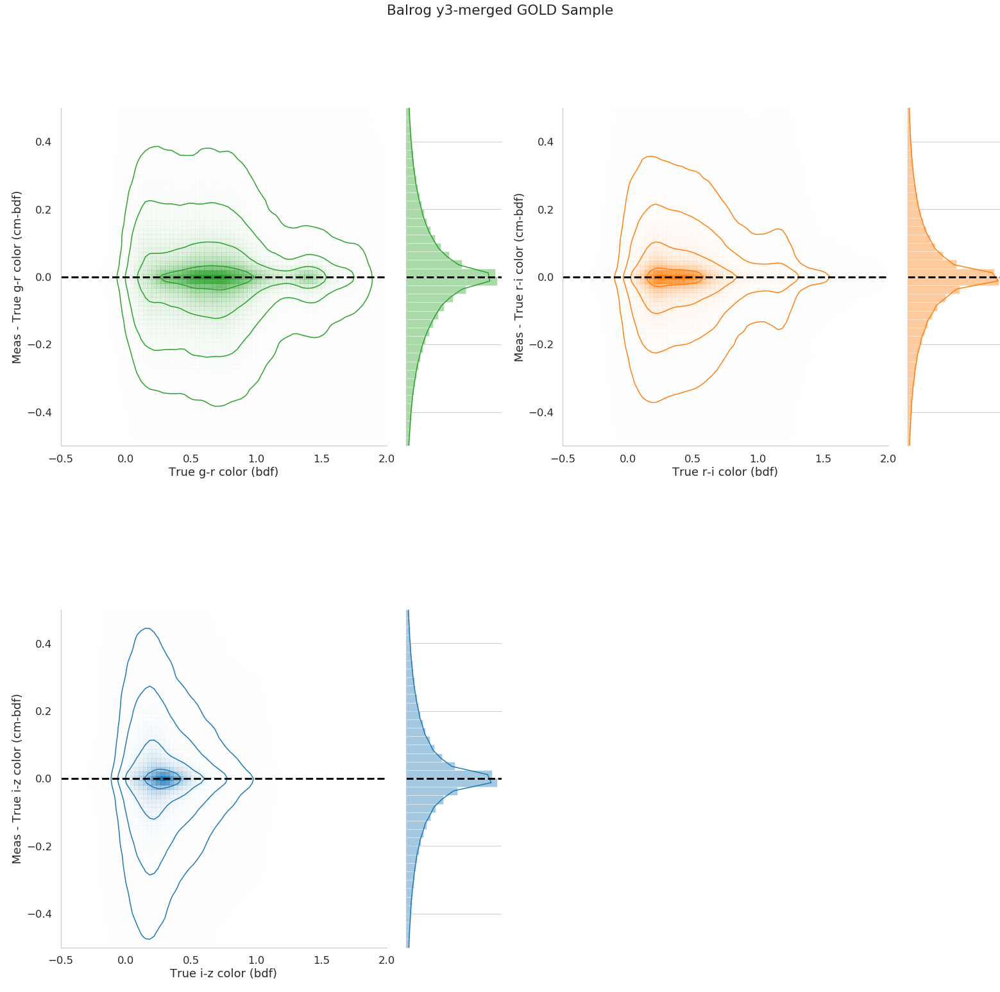

In [188]:
bindx = dict(zip('griz', [0,1,2,3]))

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = [-.5, 2]
ylim = [-.5, .5]
r = (xlim, ylim)
bins = 75

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 22
N = 10
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

k = 0
for b, bi in bindx.items():
    k += 1
    if k >= 4:
        break
    if vb is True:
        print(b, bi)
        
    x = sof['true_bdf_mag_deredden'][:, bi] - sof['true_bdf_mag_deredden'][:, bi+1] 
    y = (sof['meas_cm_mag_deredden'][:, bi] - sof['meas_cm_mag_deredden'][:, bi+1]) - x

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=True, no_fill_contours=True,
                   color=c[bi], smooth=True, lw=3)
#     plt.colorbar(g[b].ax_joint.collections[0])
    plt.axhline(0, ls='--', c='k', lw=3)
    # Colorbar
#     cbaxes = plt.gcf().add_axes([0.01, 0.15, 0.03, 0.68])
#     counts, xedges, yedges, im = plt.hist2d(x[cuts][::N], y[cuts][::N], norm=colors.LogNorm(), bins=75)
#     cb = plt.colorbar(im)
#     cbaxes.yaxis.set_ticks_position('left')
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.xlabel(f'True {b}-{bands[bi+1]} color (bdf)')
    plt.ylabel(f'Meas - True {b}-{bands[bi+1]} color (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(s, s))
gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
# mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

gs.tight_layout(fig)

# mg0.sg.ax_marg_x.remove()

        
fig.suptitle('Balrog y3-merged GOLD Sample')
fig.set_size_inches(s, s)

0
9563603
plotting true...
plotting meas...


No handles with labels found to put in legend.


1
9562839
plotting true...
plotting meas...


No handles with labels found to put in legend.


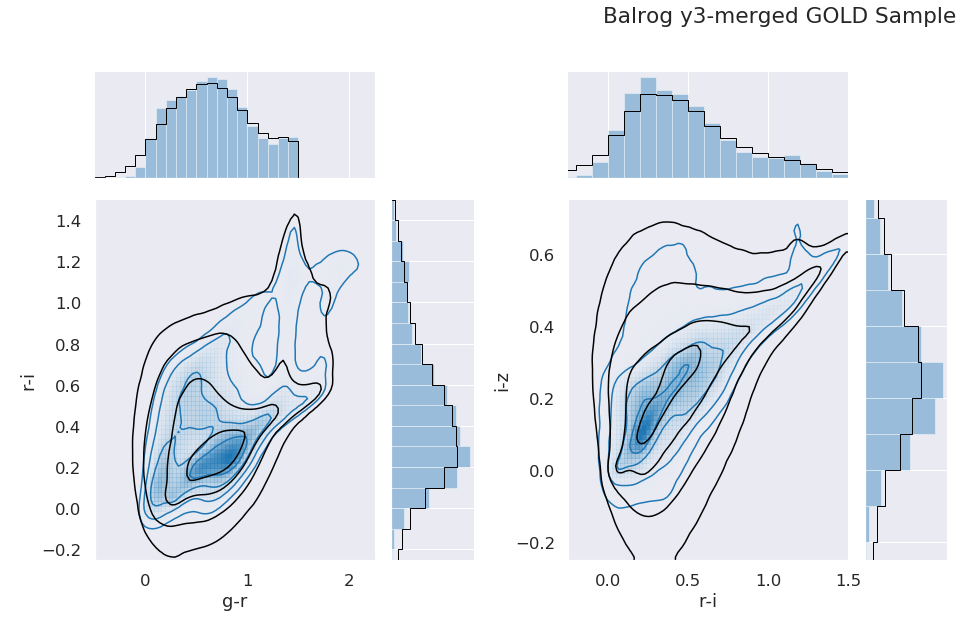

In [104]:
bindx = dict(zip('griz', [0,1,2,3]))

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = ([-.5, 2.25], [-.25, 1.5])
ylim = ([-.25, 1.5], [-.25, 0.75])
r = ((xlim[0], ylim[0]), (xlim[1], ylim[1]))

bins = 75
n_levels = 5

# dx = 0.125
# xbins = np.arange(xlim[0], xlim[1]+dx, dx)
# dy = 0.1
# ybins = np.arange(ylim[0], ylim[1]+dy, dy)

N = 1

true_c = 'tab:blue'
meas_c = 'k'

joint = 'corner'

vb = True

# fig, axes = plt.subplots(2, 2)

g = []

k = 0
colors = ['g-r', 'r-i', 'i-z']
for k in range(2):
    if vb is True:
        print(f'{k}')
        
    true_x = sof['true_bdf_mag_deredden'][:, k] - sof['true_bdf_mag_deredden'][:, k+1] # g-r
    true_y = sof['true_bdf_mag_deredden'][:, k+1] - sof['true_bdf_mag_deredden'][:, k+2] # r-i
    meas_x = sof['meas_cm_mag_deredden'][:, k] - sof['meas_cm_mag_deredden'][:, k+1] # g-r
    meas_y = sof['meas_cm_mag_deredden'][:, k+1] - sof['meas_cm_mag_deredden'][:, k+2] # r-i

    true_cuts = np.where(
        (true_x > xlim[k][0]-1) &
        (true_x < xlim[k][1]+1) &
        (true_y > ylim[k][0]-1) &
        (true_y < ylim[k][1]+1)  )
    
    meas_cuts = np.where(
        (meas_x > xlim[k][0]-1) &
        (meas_x < xlim[k][1]+1) &
        (meas_y > ylim[k][0]-1) &
        (meas_y < ylim[k][1]+1)  )

    g.append(sb.JointGrid(true_x[true_cuts][::N], true_y[true_cuts][::N], ratio=3))
    if vb is True:
        print(len(true_x[true_cuts][::N]))
        print('plotting true...')
    if joint == 'kde':
        g[k].plot_joint(sb.kdeplot, color='tab:blue', shade=True, label='True',
                        shade_lowest=False, n_levels=n_levels)
    elif joint == 'corner':
        g[k].plot_joint(corner.hist2d, range=r[k], bins=bins, scale_hist=1,
               plot_datapoints=False, plot_density=True, no_fill_contours=True,
               color=true_c, smooth=True, lw=3, label='True')
    if vb is True:
        print('plotting meas...')
    if joint == 'kde':
        sb.kdeplot(meas_x[meas_cuts][::N], meas_y[meas_cuts][::N],
                   color='k', linestyles='--', shade=False, label='Meas', n_levels=n_levels, alpha=0.7)
    elif joint == 'corner':
        corner.hist2d(meas_x[meas_cuts][::N], meas_y[meas_cuts][::N],
                      range=r[k], bins=bins, scale_hist=1, linestyles='--',
                      plot_datapoints=False, plot_density=False, no_fill_contours=True,
                      color=meas_c, smooth=True, lw=3, label='Meas')
    plt.legend(loc='lower right')
    plt.xlabel(f'{colors[k]}')
    plt.ylabel(f'{colors[k+1]}')
    plt.xlim(xlim[k])
    plt.ylim(ylim[k]) 
    
    g[k].plot_marginals(sb.distplot, color='tab:blue', bins=ybins, kde=False)
#     colors = [sb.set_hls_values('tab:blue', l=l) for l in np.linspace(1, 0, 12)]
#     cmap = sns.blend_palette(colors, as_cmap=True)
#     g[k].ax_marg_x.hist(true_x[true_cuts][::N], color='tab:blue', bins=xbins)
#     g[k].ax_marg_y.hist(true_y[true_cuts][::N], color='tab:blue', bins=ybins, orientation='horizontal')
#     g[k].x = meas_x
#     g[k].y = meas_y
    g[k].ax_marg_x.hist(meas_x[meas_cuts][::N], histtype='step', color='k', bins=ybins)
    g[k].ax_marg_y.hist(meas_y[meas_cuts][::N], histtype='step', color='k', bins=ybins, orientation='horizontal')
#     g[k].plot_marginals(sb.distplot, kde=False)#, hist_kws={'histtype':'step', 'color':'k'})
#     if vb is True:
#         print('plotting meas...')
#     g[k].plot_joint(sb.kdeplot, color='tab:green', shade=True, legend='Meas')
#     g[k].plot_marginals(sb.distplot, color='tab:green', bins=ybins)
#     plt.colorbar(g[b].ax_joint.collections[0])
#     plt.axhline(0, ls='--', c='k', lw=3)
    # Colorbar
#     cbaxes = plt.gcf().add_axes([0.01, 0.15, 0.03, 0.68])
#     counts, xedges, yedges, im = plt.hist2d(x[cuts][::N], y[cuts][::N], norm=colors.LogNorm(), bins=75)
#     cb = plt.colorbar(im)
#     cbaxes.yaxis.set_ticks_position('left')
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g[k].plot_joint(plt.hexbin, gridsize=50)   
    
fig = plt.figure(figsize=(20, 8))
gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g[0], fig, gs[0])
mg1 = SeabornFig2Grid(g[1], fig, gs[1])

fig.suptitle('Balrog y3-merged GOLD Sample')
gs.tight_layout(fig)

fig.set_size_inches(22, 9)

0
8154648
8027135
plotting true...
plotting meas...


No handles with labels found to put in legend.


1
8153803
8095145
plotting true...
plotting meas...


No handles with labels found to put in legend.


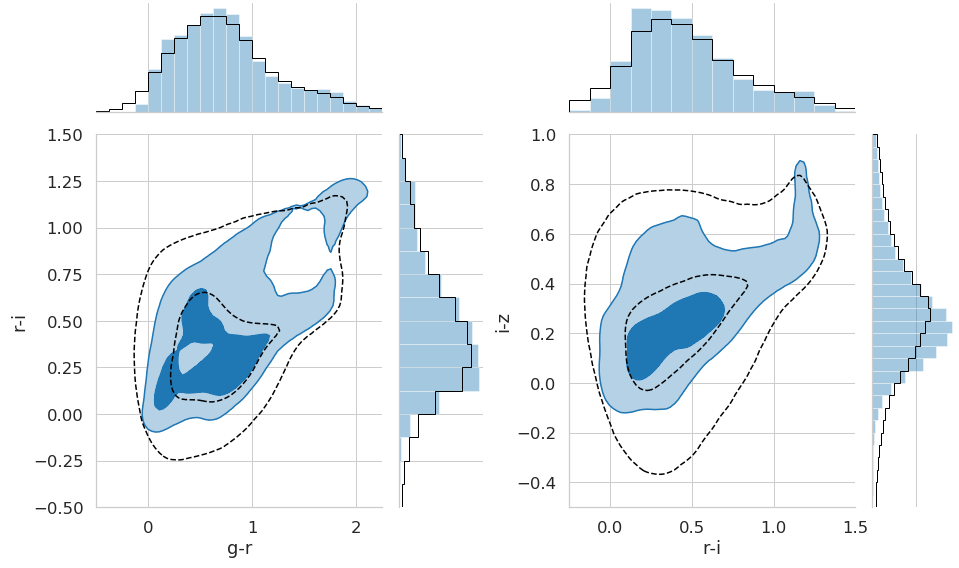

In [5]:
sb.set_style('whitegrid')

bindx = dict(zip('griz', [0,1,2,3]))

bands = 'griz'
bindx = dict(zip('griz', range(4)))

dx = [0.125, 0.125]
dy = [0.125, 0.05]
xlim = ([-.5, 2.25], [-.25, 1.5])
ylim = ([-.5, 1.5], [-.5, 1.0])
r = ((xlim[0], ylim[0]), (xlim[1], ylim[1]))

bins = 75
# n_levels = 4

# levels = np.ones(3) - np.array([0.989, 0.865, 0.393]) # 2d sigma values
# levels = np.array([0.393, 0.865, 1.]) # 2d sigma values
dl=1
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 2+dl, dl) ** 2)

# N = 1000
frac = 1 # Fraction of data to plot

true_c = 'tab:blue'
meas_c = 'k'

joint = 'corner'

vb = True

# fig, axes = plt.subplots(2, 2)

g = []

k = 0
colors = ['g-r', 'r-i', 'i-z']
for k in range(2):
    if vb is True:
        print(f'{k}')
        
    c1b1, c1b2 = colors[k][0], colors[k][2]
    c2b1, c2b2 = colors[k+1][0], colors[k+1][2]
        
    true_x = sof['true_bdf_mag_deredden'][:, k] - sof['true_bdf_mag_deredden'][:, k+1] # g-r
    true_y = sof['true_bdf_mag_deredden'][:, k+1] - sof['true_bdf_mag_deredden'][:, k+2] # r-i
    meas_x = sof['meas_cm_mag_deredden'][:, k] - sof['meas_cm_mag_deredden'][:, k+1] # g-r
    meas_y = sof['meas_cm_mag_deredden'][:, k+1] - sof['meas_cm_mag_deredden'][:, k+2] # r-i

    true_cuts = np.where(
        (true_x > xlim[k][0]-1) &
        (true_x < xlim[k][1]+1) &
        (true_y > ylim[k][0]-1) &
        (true_y < ylim[k][1]+1)  )
    
    meas_cuts = np.where(
        (meas_x > xlim[k][0]-1) &
        (meas_x < xlim[k][1]+1) &
        (meas_y > ylim[k][0]-1) &
        (meas_y < ylim[k][1]+1)  )

    Ntcuts = len(true_cuts[0])
    Nmcuts = len(meas_cuts[0])
    true_sample = np.random.choice(np.arange(Ntcuts), int(Ntcuts*frac), replace=False)
    meas_sample = np.random.choice(np.arange(Nmcuts), int(Nmcuts*frac), replace=False)

#     g.append(sb.JointGrid(true_x[true_cuts][::N], true_y[true_cuts][::N], ratio=3))
    g.append(sb.JointGrid(true_x[true_cuts][true_sample], true_y[true_cuts][true_sample], ratio=3))

    if vb is True:
        print(len(true_x[true_cuts][true_sample]))
        print(len(meas_x[meas_cuts][meas_sample]))
        print('plotting true...')
    if joint == 'kde':
        p = g[k].plot_joint(sb.kdeplot, color='tab:blue', shade=True, label='True',
                        shade_lowest=True, levels=levels)#n_levels=n_levels)
    elif joint == 'corner':
#         p = g[k].plot_joint(corner.hist2d, range=r[k], bins=bins, scale_hist=1,
#                plot_datapoints=False, plot_density=True, no_fill_contours=True,
#                color=true_c, smooth=True, lw=3, levels=levels, label='True')
        p = g[k].plot_joint(corner.hist2d, range=r[k], bins=bins, scale_hist=1,
#                plot_density=True, fill_contours=False, no_fill_contours=True
               plot_density=False, fill_contours=True,
               plot_datapoints=False, data_kwargs={'alpha':0.01}, levels=levels,
               color=true_c, smooth=True, lw=3, label='True')

    
    if vb is True:
        print('plotting meas...')
    if joint == 'kde':
        sb.kdeplot(meas_x[meas_cuts][meas_sample], meas_y[meas_cuts][meas_sample],
                   color='k', linestyles='--', shade=False, label='Meas', levels=levels, alpha=0.7)
    elif joint == 'corner':
#         corner.hist2d(meas_x[meas_cuts][meas_sample], meas_y[meas_cuts][meas_sample],
#                       range=r[k], bins=bins, scale_hist=1, linestyles='--',
#                       plot_datapoints=False, plot_density=False, no_fill_contours=True,
#                       color=meas_c, smooth=True, lw=3, levels=levels, label='Meas')
        corner.hist2d(meas_x[meas_cuts][meas_sample], meas_y[meas_cuts][meas_sample],
                  range=r[k], bins=bins, scale_hist=1, 
                  contour_kwargs={'linestyles':'dashed'},
                  plot_datapoints=False, data_kwargs={'alpha':0.01}, plot_density=False, 
                  no_fill_contours=True, levels=levels,
                  color=meas_c, smooth=True, lw=3, label='Meas')
    g[k].ax_joint.legend(loc='lower right') 
        
    plt.xlabel(f'{colors[k]}')
    plt.ylabel(f'{colors[k+1]}')
    plt.xlim(xlim[k])
    plt.ylim(ylim[k]) 
    
    xbins = np.arange(xlim[k][0], xlim[k][1]+dx[k], dx[k])
    ybins = np.arange(ylim[k][0], ylim[k][1]+dy[k], dy[k])
    
#     g[k].plot_marginals(sb.distplot, color='tab:blue', kde=False)
    sb.distplot(true_x[true_cuts][true_sample], color='tab:blue', bins=xbins, kde=False, ax=g[k].ax_marg_x, axlabel=False)
    sb.distplot(true_y[true_cuts][true_sample], color='tab:blue', bins=ybins, kde=False, ax=g[k].ax_marg_y, axlabel=False, vertical=True)
    g[k].ax_marg_x.hist(meas_x[meas_cuts][meas_sample], histtype='step', color='k', bins=xbins)
    g[k].ax_marg_y.hist(meas_y[meas_cuts][meas_sample], histtype='step', color='k', bins=ybins, orientation='horizontal')
    
fig = plt.figure(figsize=(20, 8))
gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g[0], fig, gs[0])
mg1 = SeabornFig2Grid(g[1], fig, gs[1])

# fig.suptitle('Balrog y3-merged GOLD Sample')
gs.tight_layout(fig)

plt.gca().grid()

fig.set_size_inches(24, 5)

i, 1 of 4


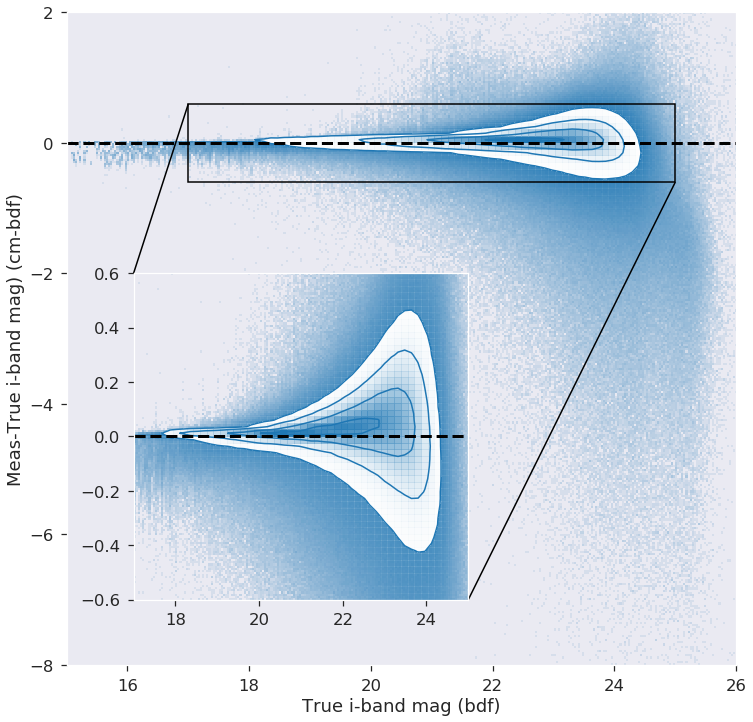

In [99]:
bindx = dict(zip('griz', [0,1,2,3]))
N = 100

k = 0
for b in 'i':
    print(f'{b}, {1} of 4')

    fig, ax0 = plt.subplots()
    ax0.set_axis_off()
#     fit = plt.Figure()
    
    bi = bindx[b]
    x = sof['true_bdf_mag_deredden'][:, bi]
    y = sof['meas_cm_mag_deredden'][:, bi] - x
    
#     plt.scatter(x[::N], y[::N], alpha=0.025, s=6, color='tab:blue')
    ax1 = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax1.scatter_density(x, y, norm=norm, dpi=40, color='tab:blue')
    plt.axhline(0, ls='--', lw=3, c='k')

    r = ((15, 26), (-8, 2))
    im = corner.hist2d(x, y, range=r, bins=100, scale_hist=1, color='tab:blue', plot_datapoints=False)
    
    plt.xlabel(f'True {b}-band mag (bdf)')
    plt.ylabel(f'Meas-True {b}-band mag) (cm-bdf)')
    
    # Create a set of inset Axes: these should fill the bounding box allocated to
    # them.
    ax2 = plt.axes([0, 0, 1, 1], projection='scatter_density')
    # Manually set the position and relative size of the inset axes within ax1
    ip = InsetPosition(ax0, [0.1, 0.1, 0.5, 0.5])
    ax2.set_axes_locator(ip)
    # Mark the region corresponding to the inset axes on ax1 and draw lines
    # in grey linking the two axes.
    mark_inset(ax1, ax2, loc1=2, loc2=4, fc="none", ec='k', lw=1.5)

#     plt.scatter(x[::N], y[::N], alpha=0.025, s=6, color='tab:blue')
#     ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax2.scatter_density(x, y, norm=norm, dpi=40, color='tab:blue')
    plt.axhline(0, ls='--', lw=3, c='k')
    
    r = ((17, 25), (-.6, .6))
    im = corner.hist2d(x, y, range=r, bins=50, scale_hist=1, color='tab:blue', plot_datapoints=False)

#     cbar = fig.colorbar(im)
    plt.gcf().set_size_inches(12, 12)
    plt.show()

i, 1 of 4


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/mpl_scatter_density/generic_density_artist.py:74: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/mpl_scatter_density/generic_density_artist.py:79: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


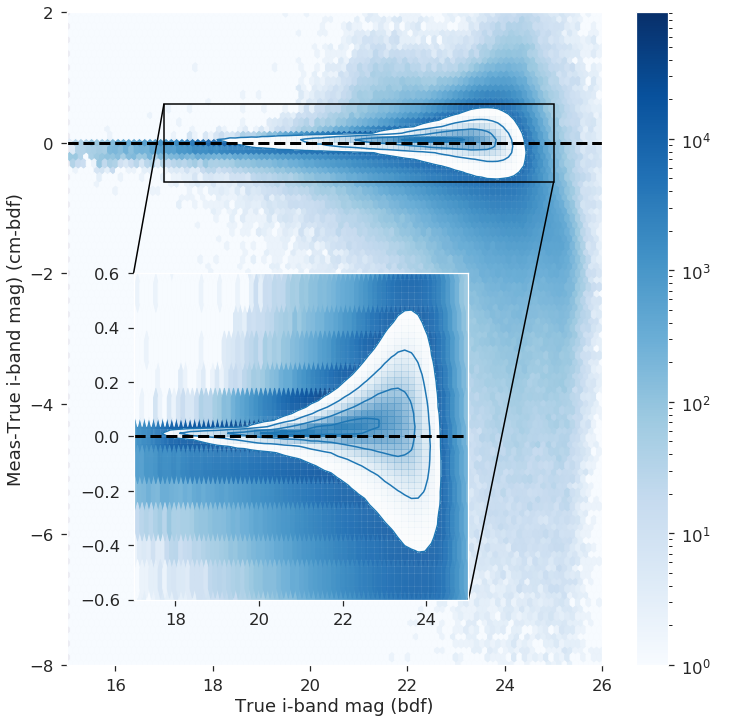

In [122]:
bindx = dict(zip('griz', [0,1,2,3]))
N = 100

xlim = [15, 26]
ylim = [-8, 4]

k = 0
for b in 'i':
    print(f'{b}, {1} of 4')

    fig, ax0 = plt.subplots()
    ax0.set_axis_off()
#     fit = plt.Figure()
    
    bi = bindx[b]
    x = sof['true_bdf_mag_deredden'][:, bi]
    y = sof['meas_cm_mag_deredden'][:, bi] - x
    
    cuts = np.where(
        (x > xlim[0]) &
        (x < xlim[1]) &
        (y > ylim[0]) &
        (y < ylim[1])  )
    
#     plt.scatter(x[::N], y[::N], alpha=0.025, s=6, color='tab:blue')
    ax1 = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax1.scatter_density(x, y, norm=norm, dpi=40, color='tab:blue')
    hb = plt.hexbin(x[cuts], y[cuts], gridsize=100, norm=colors.LogNorm(), cmap='Blues')
    plt.colorbar(hb)
    plt.axhline(0, ls='--', lw=3, c='k')

    r = ((15, 26), (-8, 2))
    im = corner.hist2d(x, y, range=r, bins=100, scale_hist=1, color='tab:blue', plot_datapoints=False)
    
    plt.xlabel(f'True {b}-band mag (bdf)')
    plt.ylabel(f'Meas-True {b}-band mag) (cm-bdf)')
    
    # Create a set of inset Axes: these should fill the bounding box allocated to
    # them.
    ax2 = plt.axes([0, 0, 1, 1], projection='scatter_density')
    # Manually set the position and relative size of the inset axes within ax1
    ip = InsetPosition(ax0, [0.1, 0.1, 0.5, 0.5])
    ax2.set_axes_locator(ip)
    # Mark the region corresponding to the inset axes on ax1 and draw lines
    # in grey linking the two axes.
    mark_inset(ax1, ax2, loc1=2, loc2=4, fc="none", ec='k', lw=1.5)

#     plt.scatter(x[::N], y[::N], alpha=0.025, s=6, color='tab:blue')
#     ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax2.scatter_density(x, y, norm=norm, dpi=40, color='tab:blue')
    hb = plt.hexbin(x[cuts], y[cuts], gridsize=100, norm=colors.LogNorm(), cmap='Blues')
    plt.axhline(0, ls='--', lw=3, c='k')
    
    r = ((17, 25), (-.6, .6))
    im = corner.hist2d(x, y, range=r, bins=50, scale_hist=1, color='tab:blue', plot_datapoints=False)

#     cbar = fig.colorbar(im)
    plt.gcf().set_size_inches(12, 12)
    plt.show()

Plotting hexbin...
Plotting KDE...


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


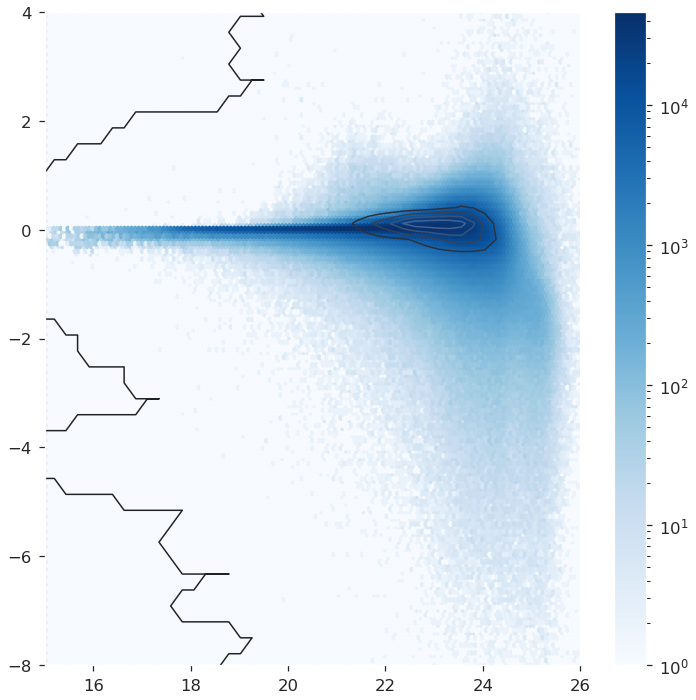

In [123]:
xlim = [15, 26]
ylim = [-8, 4]

N = 100
n_levels=4

cuts = np.where(
    (x > xlim[0]) &
    (x < xlim[1]) &
    (y > ylim[0]) &
    (y < ylim[1])  )

print('Plotting hexbin...')
hb = plt.hexbin(x[cuts], y[cuts], gridsize=150, norm=colors.LogNorm(), cmap='Blues')
plt.colorbar(hb)

data = np.vstack([x, y])
data = data.T
print('Plotting KDE...')
sb.kdeplot(data[::N], n_levels=n_levels)

plt.xlim(xlim)
plt.ylim(ylim)

plt.gcf().set_size_inches(12, 12)

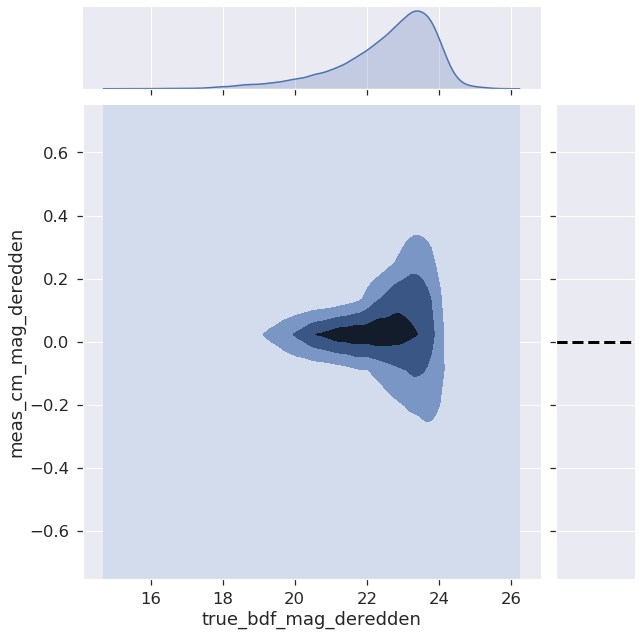

In [152]:
sb.jointplot(x[cuts][::N], y[cuts][::N], kind="kde", n_levels=3)
plt.xlim(xlim)
plt.ylim([-.75, .75])
plt.axhline(0, c='k', ls='--', lw=3)
plt.gcf().set_size_inches(10,10)

NameError: name 'x' is not defined

/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """Entry point for launching an IPython kernel.


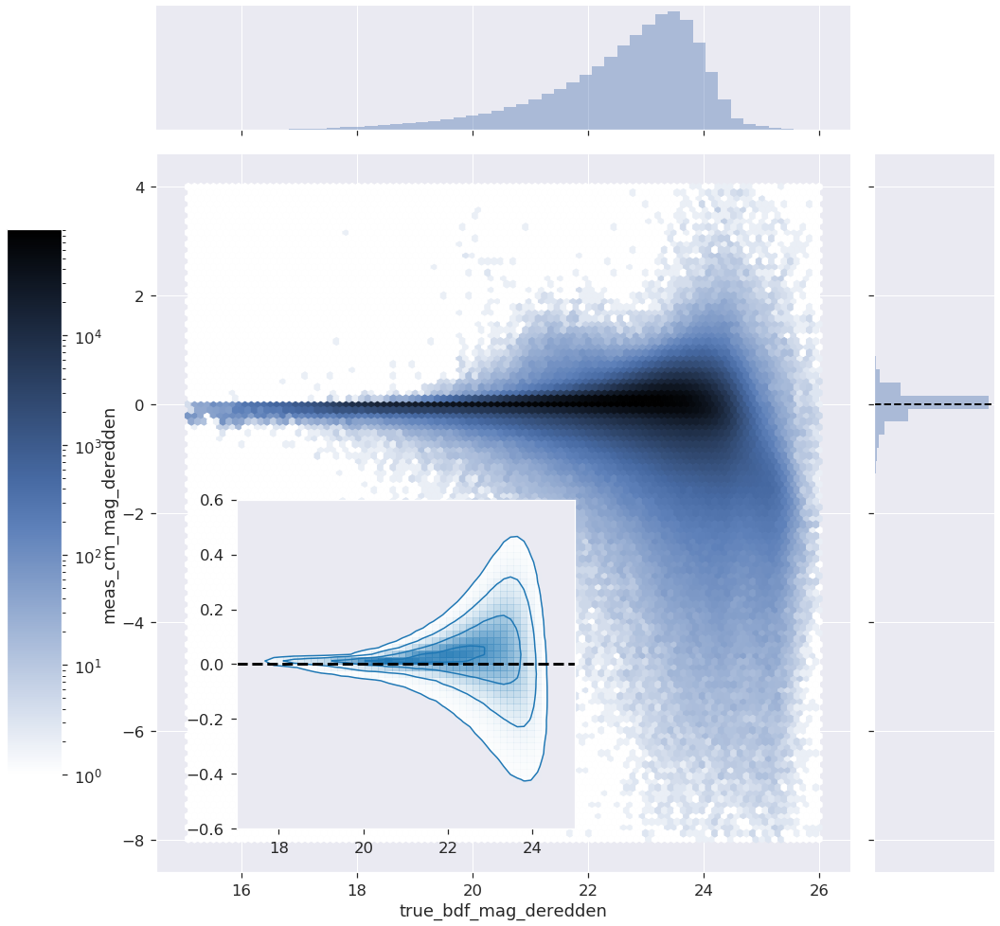

In [157]:
ax1 = fig.add_subplot(1, 1, 1)


jp = sb.jointplot(x[cuts], y[cuts], kind="hex", gridsize=100, norm=colors.LogNorm())
ax1.axhline(0, c='w', ls='--', lw=3)
# corner.hist2d(x, y, range=r, bins=50, scale_hist=1, color='tab:blue', plot_datapoints=False, plot_density=False)
plt.axhline(0, c='k', ls='--', lw=2)



# Create a set of inset Axes: these should fill the bounding box allocated to
# them.
ax2 = plt.axes([0, 0, 1, 1])
# Manually set the position and relative size of the inset axes within ax1
ip = InsetPosition(ax0, [0.175, 0.1, 0.4, 0.4])
ax2.set_axes_locator(ip)
# Mark the region corresponding to the inset axes on ax1 and draw lines
# in grey linking the two axes.
# mark_inset(ax1, ax2, loc1=2, loc2=4, fc="none", ec='k', lw=1.5)

#     plt.scatter(x[::N], y[::N], alpha=0.025, s=6, color='tab:blue')
#     ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
r = ((17, 25), (-.6, .6))
im = corner.hist2d(x, y, range=r, bins=50, scale_hist=1, color='tab:blue', plot_datapoints=False)
# density = ax2.scatter_density(x, y, norm=norm, dpi=40, color='tab:blue')
# hb = plt.hexbin(x[cuts], y[cuts], gridsize=100, norm=colors.LogNorm(), cmap='Blues')
plt.axhline(0, ls='--', lw=3, c='k')
# sb.kdeplot(x[::N], y[::N])

cbar_ax = jp.fig.add_axes([0.025, .25, .035, .5])  # x, y, width, height
plt.colorbar(cax=cbar_ax)

plt.gcf().set_size_inches(16, 16)

In [13]:
N = 100

bindx = dict(zip('griz', range(4)))

k = 0
for b in 'i':
    print(f'{b}, {1} of 4')
    bi = bindx[b]
    x = sof['true_bdf_mag_deredden'][:, bi]
    y = sof['meas_cm_mag_deredden'][:, bi] - x
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax.scatter_density(x, y, norm=norm, dpi=20)
    ax.set_xlim(15, 27)
    ax.set_ylim(-10, 8)
    plt.gcf().set_size_inches(8,8)
    fig.colorbar(density, label='Number of points per pixel')
    


TypeError: 'tuple' object is not callable

In [20]:
range

((15, 30), (-9, 9))

(-8, 8)

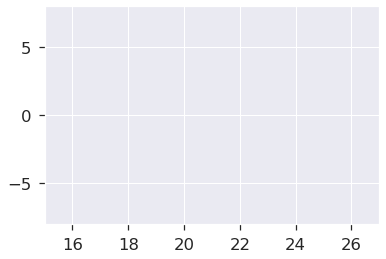

In [12]:
plt.scatter(x, y, alpha=0.0005)
plt.xlim([15, 27])
plt.ylim(-8, 8)

(2, 8400)
Running KDE...


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/ipykernel_launcher.py:58: UserWarning: No contour levels were found within the data range.


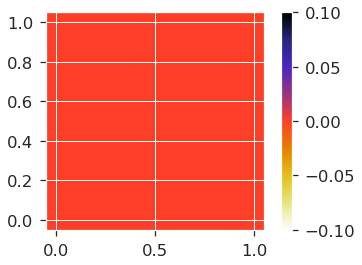

In [7]:
from scipy.stats import gaussian_kde

bindx = dict(zip('griz', range(4)))
bi = bindx['i']

# parameters
bins = 100          # number of bins in density maps
threshold = 0.01    # density threshold for scatter plot

xlim = [15, 25]
ylim = [-.0001, .0001]

fig, ax = plt.subplots()

x = sof['true_bdf_mag_deredden'][:, bi]
y = sof['meas_cm_mag_deredden'][:, bi] - x

cuts = np.where(
    (x >= xlim[0]) &
    (x <= xlim[1]) &
    (y >= ylim[0]) &
    (y <= ylim[1])  )

xx = x[cuts]
yy = y[cuts]
points = np.vstack([xx.T, yy.T])
print(points.shape)

print('Running KDE...')
kde = gaussian_kde(points)
z = kde(points)

# mask points above density threshold
x = np.ma.masked_where(z > threshold, xx)
y = np.ma.masked_where(z > threshold, yy)

# plot unmasked points
ax.scatter(x, y, c='black', marker='.')

# get bounds from axes
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()

# prepare grid for density map
xedges = np.linspace(xmin, xmax, bins)
yedges = np.linspace(ymin, ymax, bins)
xx, yy = np.meshgrid(xedges, yedges)
gridpoints = np.array([xx.ravel(), yy.ravel()])

# compute density map
zz = np.reshape(kde(gridpoints), xx.shape)

# plot density map
im = ax.imshow(zz, cmap='CMRmap_r', interpolation='nearest',
               origin='lower', extent=[xmin, xmax, ymin, ymax])

# plot threshold contour
cs = ax.contour(xx, yy, zz, levels=[threshold], colors='black')

# show
fig.colorbar(im)
plt.show()

## Pair Plot

In [18]:
print('setting up grid...')
g = sb.PairGrid(sof)
print('plotting upper...')
g.map_upper(sb.scatterplot)
print('plotting lower...')
g.map_lower(corner.corner())
print('plotting corner...')
g.map_diag(corner.corner(), lw=3, legend=False)

setting up grid...


IndexError: index -1 is out of bounds for axis 0 with size 0

<Figure size 0x0 with 0 Axes>

In [ ]:
s['g'] = sof['meas_']

g 0
r 1
i 2
z 3


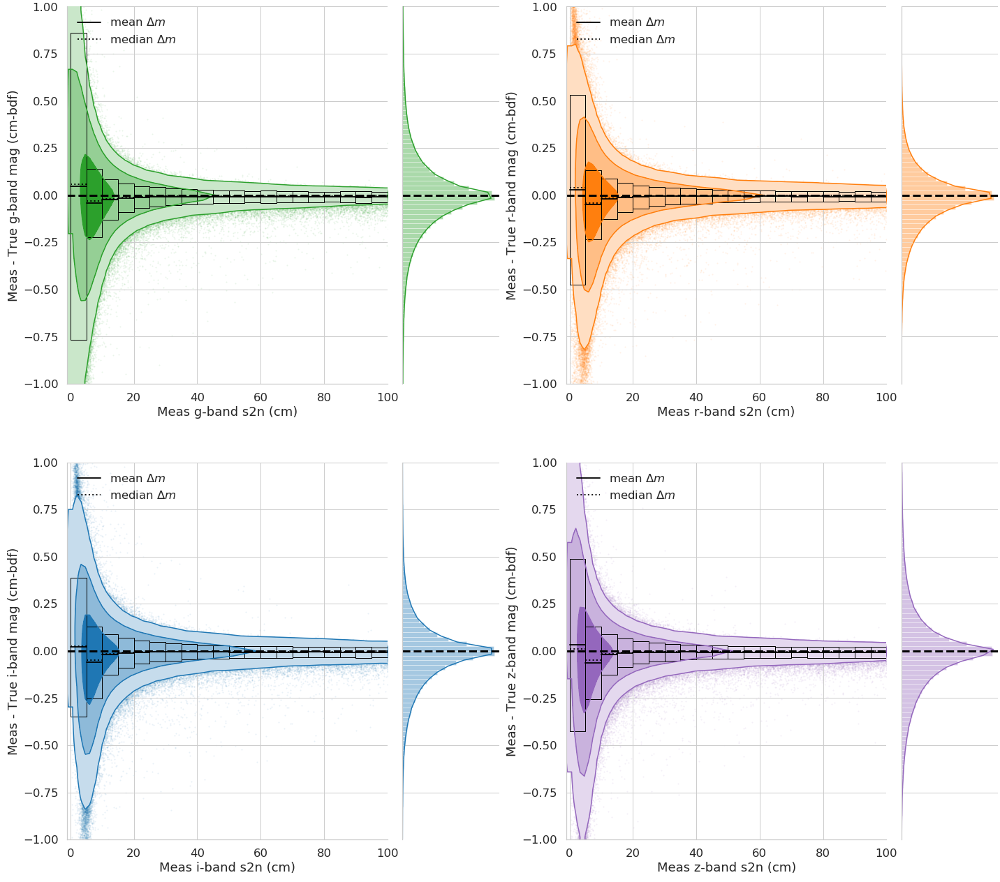

In [4]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = [0, 100]
ylim = [-1, 1]
r = (xlim, ylim)
bins = 75

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 20
N = 1
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']
# c = ['limegreen', 'salmon', 'skyblue', 'orchid']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

mag_suffix = '_deredden' # For corrected mags
# mag_suffix = '' # For uncorrected mags

stats_t = Table()

k = 0
for b, bi in bindx.items():
    k += 1
    if vb is True:
        print(b, bi)
        
    x = sof['meas_cm_flux_s2n'][:, bi]
    y = sof[f'meas_cm_mag{mag_suffix}'][:, bi] - sof[f'true_bdf_mag{mag_suffix}'][:, bi]

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=False,
                   fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels)
    plt.plot(x[cuts][::N], y[cuts][::N], "o", ms=2, zorder=-1, rasterized=True, alpha=0.1, c=c[bi], mec='None')
#     plt.hist2d(x[cuts][::10*N], y[cuts][::10*N], range=r, bins=75, scale_hist=1,
#                    plot_datapoints=True, plot_density=False, no_fill_contours=True,
#                    plot_contours=False, color=c[bi])
    plt.axhline(0, ls='--', c='k', lw=3)
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    # Get rolling bias & scatter
    dx = 5
    xbins = np.arange(xlim[0], xlim[1]+dx, dx)
    mean, med, scatter, bin_mean = calc_bin_stats(x, y, xbins)
    
    k = 0
    for b1, b2 in zip(xbins, xbins[1:]):
        if k == 0:
            l1 = r'mean $\Delta m$'
            l2 = r'median $\Delta m$'
        else:
            l1 = None
            l2 = None
        plt.plot([b1, b2], [mean[k], mean[k]], c='k', label=l1, lw=2, alpha=0.9)
        plt.plot([b1, b2], [med[k], med[k]], c='k', ls=':', label=l2, lw=2, alpha=0.9)
#         plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='lightgrey', edgecolor='dimgrey', alpha=0.2)
        plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='None', edgecolor='k')
        k += 1
#     plt.step(xbins[:-1], mean, c='r', label=r'mean $\Delta m$')
#     plt.step(xbins[:-1], med, c='g', label=r'median $\Delta$ m$')
    plt.legend(loc='upper left')
    
    # Save to table
    stats_t[f'mean_{b}'] = mean
    stats_t[f'med_{b}'] = med
    stats_t[f'std_{b}'] = scatter
    stats_t[f'bin_mean_{b}'] = bin_mean

    plt.xlim(xlim - np.array([1, 0]))
    plt.ylim(ylim)
    plt.xlabel(f'Meas {b}-band s2n (cm)')
    plt.ylabel(f'Meas - True {b}-band mag (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(s, s))
gs = gridspec.GridSpec(2, 2)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

# mg0.sg.ax_marg_x.remove()

plt.tight_layout()
# fig.suptitle('Balrog y3-merged GOLD Sample')
fig.set_size_inches(s, s)

# Save table
if 'deredden' in mag_suffix:
    l = 'deredden'
else:
    l = 'uncorrected'
stats_t.write(f'./tables/grid-gal-scatter-mag-stats-{l}-s2n.fits', overwrite=True)

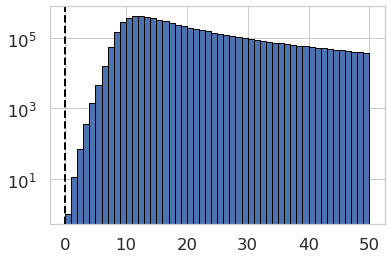

In [47]:
plt.hist(sof['meas_cm_s2n_r'],bins=np.arange(0, 51, 1), ec='k')
plt.axvline(0, ls='--', c='k', lw=2)
plt.yscale('log')

In [48]:
low = sof[sof['meas_cm_s2n_r'] <= 5]
print(len(low))

1830


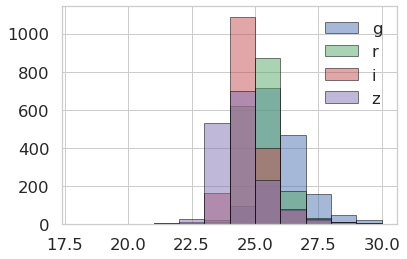

In [51]:
bins = np.arange(18, 31, 1)
for bi in range(4):
    plt.hist(low['meas_cm_mag'][:,bi], label='griz'[bi], bins=bins, ec='k', alpha=0.5)
plt.legend()

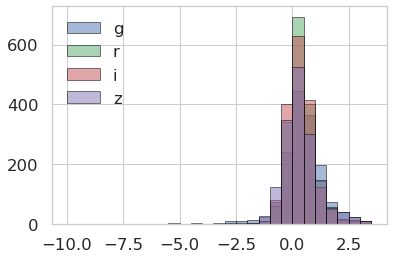

In [54]:
bins = np.arange(-10, 4, 0.5)
for bi in range(4):
    plt.hist(low['meas_cm_mag'][:,bi]-low['true_bdf_mag'][:,bi], label='griz'[bi], bins=bins, ec='k', alpha=0.5)
plt.legend()